In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
import numpy as np
import os
import sys
import glob
import pandas as pd
import xml.etree.ElementTree as et

import datetime
from imageio import volread as imread
import tifffile
#from pystackreg import StackReg
from skimage.filters import threshold_otsu

import seaborn as sns
#from pystackreg.util import to_uint16

In [2]:
# load images
D10_images = sorted(glob.glob('../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/*'))
D28_images = sorted(glob.glob('../Figures/Example_FOVs_by_CellCount/Coverslip13_MP/*'))
print(D10_images)
print(D28_images)
images_D10 = [imread(x) for x in D10_images]
images_D28 = [imread(x) for x in D28_images]

['../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F052_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F053_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F054_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F055_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F056_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F063_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F064_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F065_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F066_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F074_mp_score_max.tif']
['../Figures/Example_FOVs_by_CellCount/Coverslip13_MP/F091_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip13_MP/F117_mp_score_max.tif', '../Figures/Example_FOVs_by_CellCount/Coverslip13_MP/F136_mp_score_max.tif', '../Fig

In [3]:
print(D10_images[7], D28_images[5])

../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F065_mp_score_max.tif ../Figures/Example_FOVs_by_CellCount/Coverslip13_MP/F165_mp_score_max.tif


In [4]:
# Create an image with each row as a different color
tab20 = plt.get_cmap('tab20').colors
extra_colors = [(0.8, 0.2, 0.6), (0.1, 0.7, 0.2)]  # Example additional distinct colors

# Combine them to form a custom colormap
custom_colors = list(tab20) + extra_colors
custom_cmap = plt.matplotlib.colors.ListedColormap(custom_colors)

In [5]:
# print sizes
for im in images_D28:
    print(im.shape)

(22, 2008, 2000)
(22, 2008, 2000)
(22, 2008, 2000)
(22, 2008, 2000)
(22, 2008, 2000)
(22, 2008, 2000)
(22, 2008, 2000)
(22, 2008, 2000)
(22, 2008, 2000)
(22, 2008, 2000)


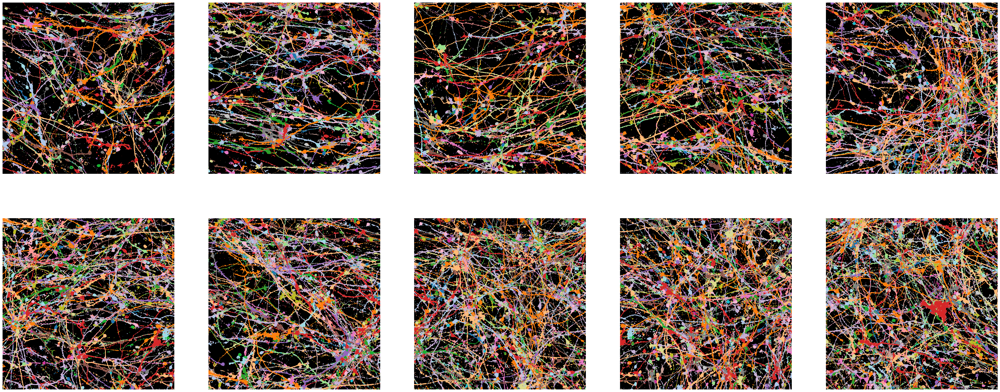

In [6]:
#z=z.transpose(1,0,2,3)
fig, axs = plt.subplots(2,5, figsize = (50,20))
axs = axs.ravel()
for i in range(len(axs)):
    im_to_plot = images_D10[i]
    #cm = plt.get_cmap('tab20')
    custom_cmap.set_bad('k')
    axs[i].matshow(np.where(im_to_plot.max(0)==0,np.nan,im_to_plot.argmax(0)),cmap=custom_cmap)
    axs[i].axis('off')

In [7]:
len(images_D10)

10

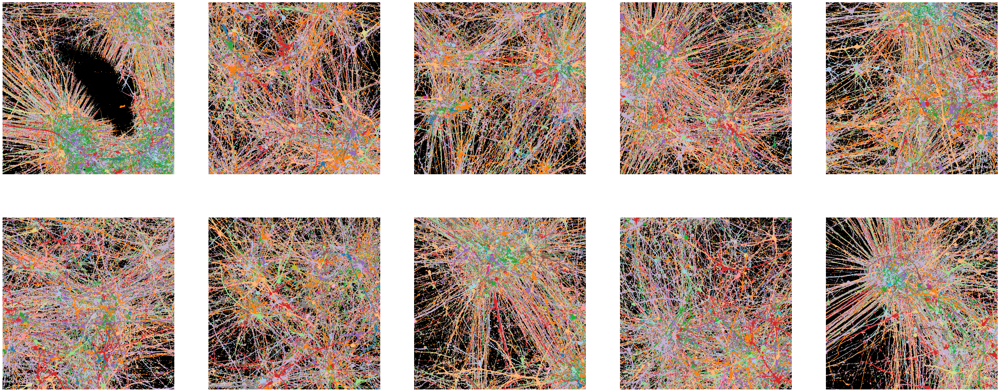

In [8]:
#z=z.transpose(1,0,2,3)
fig, axs = plt.subplots(2,5, figsize = (50,20))
axs = axs.ravel()
for i in range(len(axs)):
    im_to_plot = images_D28[i]
    #cm = plt.get_cmap('tab20')
    custom_cmap.set_bad('k')
    axs[i].matshow(np.where(im_to_plot.max(0)==0,np.nan,im_to_plot.argmax(0)),cmap=custom_cmap)
    axs[i].axis('off')

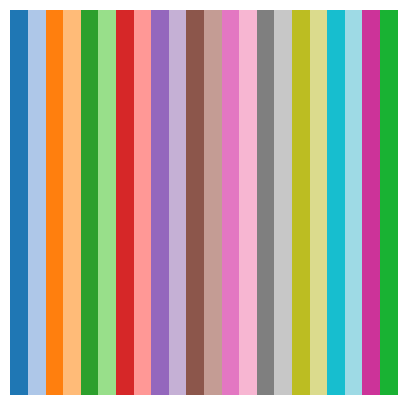

In [9]:
# Create an image with each row as a different color
tab20 = plt.get_cmap('tab20').colors
extra_colors = [(0.8, 0.2, 0.6), (0.1, 0.7, 0.2)]  # Example additional distinct colors

# Combine them to form a custom colormap
custom_colors = list(tab20) + extra_colors
custom_cmap = plt.matplotlib.colors.ListedColormap(custom_colors)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack([gradient] * 22)
fig, ax = plt.subplots(1,1, figsize= (5,5))
ax.imshow(gradient, aspect='auto', cmap=custom_cmap)
ax.set_axis_off()

plt.savefig('../Figures/22colormap.png', format='png', bbox_inches='tight')
plt.savefig('../Figures/22colormap.eps', format='eps', bbox_inches='tight')
plt.show()

In [10]:
#print(images_D28[5])
#print(images_D10[7])
os.getcwd()

'/Users/bkang/Desktop/lab/Kang_et_al_Image/src'

In [12]:
for x in D10_images:
    print(x)
print('--')
for x in D28_images:
    print(x)


../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F052_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F053_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F054_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F055_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F056_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F063_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F064_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F065_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F066_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip1_MP/F074_mp_score_max.tif
--
../Figures/Example_FOVs_by_CellCount/Coverslip13_MP/F091_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip13_MP/F117_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coverslip13_MP/F136_mp_score_max.tif
../Figures/Example_FOVs_by_CellCount/Coversli

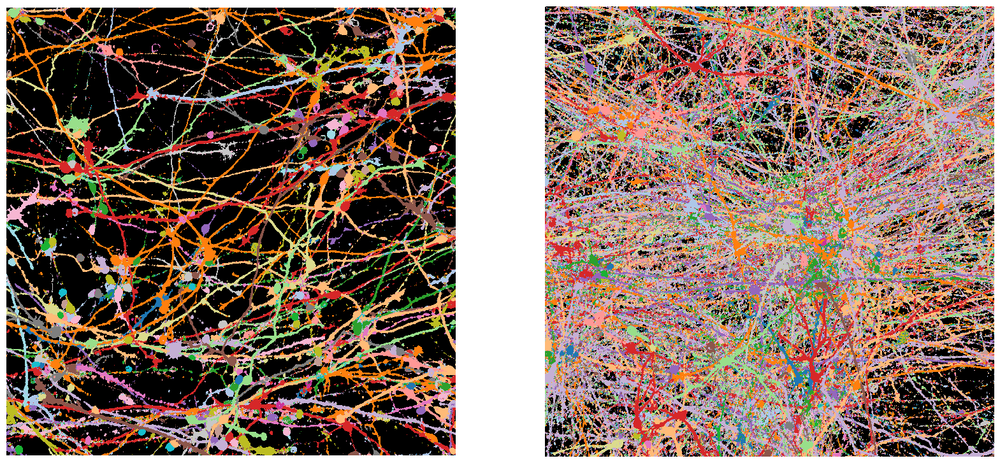

In [14]:
# generate figures with seleted FOVs
fig, axs = plt.subplots(1,2, figsize = (20,10))
custom_cmap.set_bad('k')

axs[0].matshow(np.where(images_D10[2].max(0)==0,np.nan,images_D10[2].argmax(0)),cmap=custom_cmap)
axs[1].matshow(np.where(images_D28[5].max(0)==0,np.nan,images_D28[5].argmax(0)),cmap=custom_cmap)

for ax in axs:
    ax.axis('off')

# Save the figure as PNG and EPS
plt.savefig('../Figures/MP_output_example.png', format='png', bbox_inches='tight')
plt.savefig('../Figures/MP_output_example.eps', format='eps', bbox_inches='tight')

plt.show()


In [ ]:
# generate figures with seleted FOVs
fig, axs = plt.subplots(1,2, figsize = (20,10))
custom_cmap.set_bad('k')

axs[0].matshow(np.where(images_D10[7].max(0)==0,np.nan,images_D10[7].argmax(0)),cmap=custom_cmap)
axs[1].matshow(np.where(images_D28[5].max(0)==0,np.nan,images_D28[5].argmax(0)),cmap=custom_cmap)

for ax in axs:
    ax.axis('off')

# Save the figure as PNG and EPS
plt.savefig('../Figures/MP_output_example.png', format='png', bbox_inches='tight')
plt.savefig('../Figures/MP_output_example.eps', format='eps', bbox_inches='tight')

plt.show()


In [48]:
im_to_plot.shape

(22, 2015, 2018)

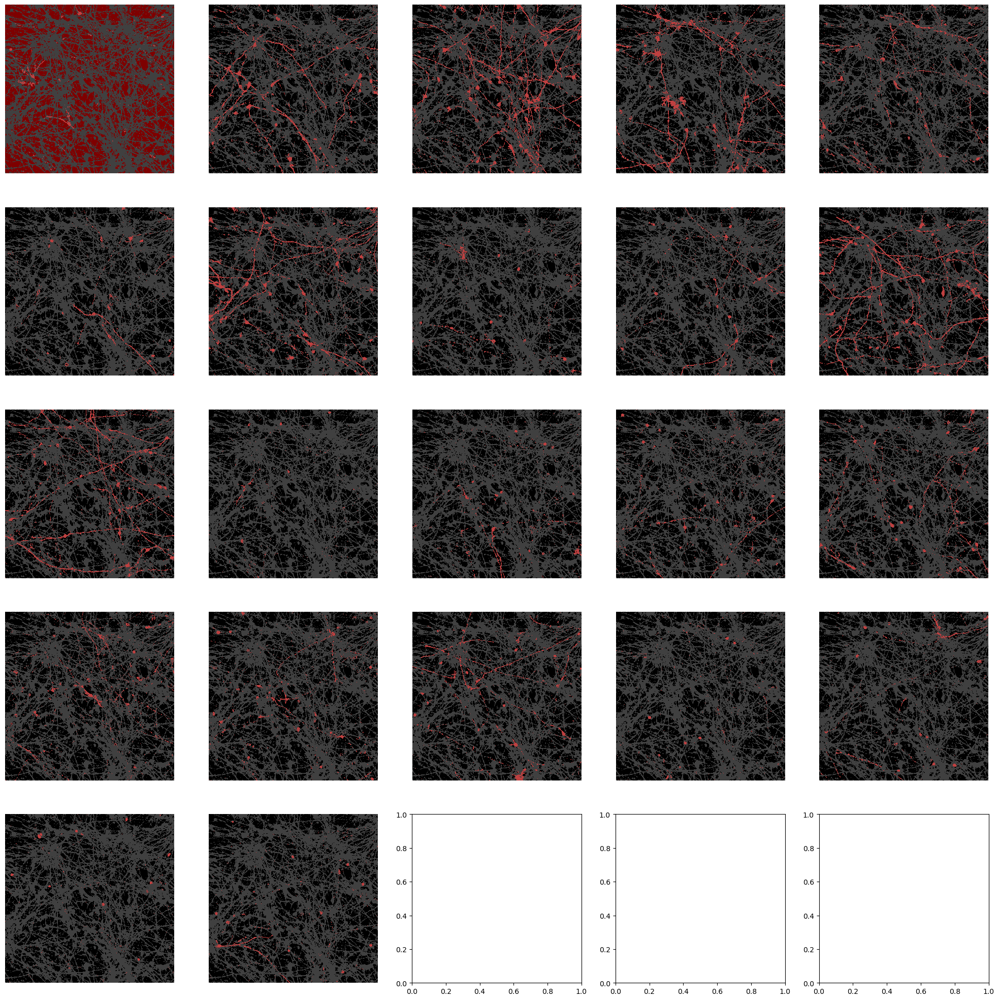

In [54]:
# plot one by one, red in black background. 
import matplotlib.colors as mcolors

fig, axs = plt.subplots(5,5, figsize = (25,25))
uniform_gray = mcolors.ListedColormap(['gray'])
uniform_gray.set_bad('k')

uniform_red = mcolors.ListedColormap(['red'])
uniform_red.set_bad('k')

axs = axs.ravel()
im_to_plot = images_D10[7]
for i in range(22):
    axs[i].matshow(np.where(im_to_plot.max(0)==0, np.nan, im_to_plot.argmax(0)), cmap=uniform_gray )
    #axs[i].matshow(np.where(im_to_plot.max(0)==0, np.nan, im_to_plot.argmax(0)==i), cmap=uniform_red)
    # Overlay the red cells
    #red_cells = np.where(im_to_plot.argmax(0) == i, 1, np.nan)  # Create a mask for red cells
    red_cells = np.where(im_to_plot.argmax(0) == i, i, np.nan)  # Create a mask for red cells
    axs[i].matshow(red_cells, cmap=uniform_red, alpha=0.5)  # Adjust alpha for overlay
    
    ## img_bin[ch] = np.where(img.max(0)==0, 0, img.argmax(0)==ch) ## Try this one later.
    
    axs[i].axis('off')
plt.savefig('../Figures/individual_mp_channel.png', format='png', bbox_inches='tight')

plt.savefig('../Figures/individual_mp_channel.eps', format='eps', bbox_inches='tight')
